In [3]:
import sys  
path_project = '/home/danshach/pot_store/gpfs_scratch/Xalantir'
sys.path.insert(1, path_project)
import arguments
from base import detector, setup, data_augmentation, experiment_dataloader, simulation_dataloader
import matplotlib
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import math
import fabio

In [4]:
def find_image(images, df, r=[4.0],d=[10.0],s=[0.2],o=[0.2]):
    idm = df[((df.radius).isin(r))&((df.sigma_radius).isin(s))&((df.distance).isin(d))&((df.omega_distance).isin(o))].index
    print(idm)
    return images[idm]

In [5]:
n1 = 500
n2 = 500
two_theta_f_max = 4.0 # out-of-plane angle
two_theta_f_min = 0.0
alpha_f_min = 0.0 # corresponding exit angle
alpha_f_max = 4.0
alpha_i = 0.395 # angle between beam and sample surface
# detector parameters (Pilatus1M)
height, width = (1043, 981)
ps_y = 172e-6 * 1000 # Pilatus 1M pixel size in mm (microm*1000=mm)
ps_x = 172e-6 * 1000

db_y = 135 # direct beam position qz
db_x = 466 # direct beam position qy horisontal cut position
d_sd = 2357 # probe-detector abstand in mm


detector_mask = fabio.open('/home/danshach/pot_store/beegfs_scratch/simple_net/masks/Pilatus_1M.tif').data

y = np.linspace(start=0, stop=(height - db_y), num=(height - db_y), dtype=np.float32) * ps_y  
x = np.linspace(start=0, stop=(width - db_x), num=(width - db_x), dtype=np.float32) * ps_x    
two_theta_f = np.degrees(np.arctan(x/d_sd))             # [degree]
alpha_f = np.degrees(np.arctan(y/d_sd)) - alpha_i 
two_theta_f_crop_index = int(round((two_theta_f.max()/(two_theta_f_max - two_theta_f_min)) * n2))
alpha_f_crop_index = int(round((alpha_f.max()/(alpha_f_max - alpha_f_min)) * (n1-1)))
vertical_cut = db_y + np.count_nonzero(alpha_f < 0.0) # 230



def crop_detector_mask(mask):
    detector_mask = np.flip(np.flip(mask, axis=0), axis=1)
    height, width = detector_mask.shape
    y = vertical_cut
    x = db_x
    return detector_mask[y:, (width-x):width]

def bin_mask(mask_to_bin, bin_to_shape):
    mask = np.empty(shape=bin_to_shape)
    y_bin = mask_to_bin.shape[0] / bin_to_shape[0]
    x_bin = mask_to_bin.shape[1] / bin_to_shape[1]
    for i in range(0, bin_to_shape[0], 1):
        for j in range(0, bin_to_shape[1], 1):
            # floor: round number down to the nearest integer
            # ceil: round a number upward to its nearest integer
            from_y = math.floor(i * y_bin)
            to_y = math.ceil((i + 1) * y_bin)
            from_x = math.floor(j * x_bin)
            to_x = math.ceil((j + 1) * x_bin)
            mask[i, j] = mask_to_bin[from_y: to_y, from_x: to_x].sum() / (y_bin * x_bin)

    for i in range(0, mask.shape[0]):
        for j in range(0, mask.shape[1]):
            if mask[i, j] < 1.0:
                if mask[i, j] >= 0.5:
                    mask[i, j] = 1.0
                else:
                    mask[i, j] = 0.0
            elif mask[i, j] >= 1.0:
                mask[i, j] = 1.0
    return mask.astype(np.float32)

def crop_window(image, y=260, x=13):
    return image[:y, x:]
# crop masks
detector_mask = crop_detector_mask(detector_mask)
shape_to_bin = (int(math.ceil(0.5 * detector_mask.shape[0])), int(math.ceil(0.5 * detector_mask.shape[1])))
detector_mask = crop_window(bin_mask(detector_mask, bin_to_shape=shape_to_bin))

In [6]:
def crop_simulation(image, y, x):
    return image[0:y, 0:x]

def bin_int(to_bin, bin_to_shape):
    binned_image = np.empty(shape=bin_to_shape)
    y_bin = to_bin.shape[0] / bin_to_shape[0]
    x_bin = to_bin.shape[1] / bin_to_shape[1]
    for i in range(0, bin_to_shape[0], 1):
        for j in range(0, bin_to_shape[1], 1):
            # floor: round number down to the nearest integer
            # ceil: round a number upward to its nearest integer
            from_y = i * int(y_bin)
            to_y = (i + 1) * int(y_bin)
            from_x = j * int(x_bin)
            to_x = (j + 1) * int(x_bin)
            binned_image[i, j] = to_bin[from_y: to_y, from_x: to_x].sum()
    return binned_image

def normalize(image):
    return ((image - image.min()) / (image.max() - image.min())).astype(np.float32)

def mask_image(image, mask):
    masked_image = np.ma.masked_array(image, mask=mask).astype(np.float32)
    masked_image = masked_image.filled(fill_value=0.0)
    return masked_image

In [34]:
######### set style
pt = 1./72.27 # Hundreds of years of history... 72.27 points to an inch.
jour_sizes = {"PRD": {"onecol": 246.*pt, "twocol": 510.*pt},
              "CQG": {"onecol": 374.*pt}, # CQG is only one column
              # Add more journals below. Can add more properties to each journal
             }
my_width = jour_sizes["PRD"]["twocol"]
#my_width = jour_sizes[""]

# Our figure's aspect ratio
golden = (1 + 5 ** 0.5) / 2
plt.style.use("thesis.mplstyle")

In [32]:
######## plot functions

def draw_plot(image, title = None, z_limits=[0, 0.9],cmap='nipy_spectral', scale=False,save=False,v_linecut=None,factor=0):
    #figure = plt.figure(figsize=(my_width,my_width/golden), dpi=600)
    figure = plt.figure(figsize=(5,5), dpi=600)

    if scale:
        z_limits, data = get_z_limits_data_log(z_limits, image) # insure non non-positive values in input and z-limits
        log_norm = matplotlib.colors.LogNorm(vmin=z_limits[0], vmax=z_limits[1])
        norm = log_norm
    else:
        data = image
        norm = matplotlib.colors.Normalize(vmin=0, vmax=image.max())
    img = plt.imshow(data,origin='lower', interpolation='nearest', aspect='auto')
    if v_linecut is not None: plt.axvline(x = v_linecut, color = 'r')
    plt.pcolor(data,norm=norm, cmap=cmap) # other color maps: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    plt.axis() # [xmin,xmax,ymin,ymax]
    plt.ylabel('y [pixel]')
    plt.xlabel('x [pixel]')
    plt.tick_params(top=False)
    #if title: plt.title(title) # title
    #plt.tight_layout()
    cbar=plt.colorbar()
    cbar.set_label("intensity")
    if save:
        plt.savefig(path_project + '/evaluation/figures/simulation_' + title + '.png')
    plt.show()

def get_z_limits_data_log(z_limits, data):
    # non-positive colour range minimum: change to half of smallest positive number
    if z_limits[0] <= 0.:
        z_limits[0] = np.where(data > 0, data, data.max()).min() * 0.5
        if z_limits[0] <= 0.:  # pathological case: data.max () <= 0
            z_limits[0] = 0.1
    if z_limits[1] < z_limits[0]:  # another pathological case
        z_limits[1] = 100. * z_limits[0]
    # set non-positive data to new z_lim[0] to avoid that zeros are shown in white for some colour maps where white is upper end
    data[data <= 0] = z_limits[0]
    return z_limits, data

In [10]:
images = np.load(path_project + '/raw_simulations.npy')
targets = pd.read_csv(path_project + '/target_values_raw_simulations', index_col=0)

In [17]:
targets

,id_sf,id_ff,key_sf,key_ff,distance,omega_distance,radius,sigma_radius
0,0,1,113,6,3.0,0.01,1.0,0.01
1,0,1,131,6,3.0,0.25,1.0,0.01
2,1,1,2265,6,3.0,0.50,1.0,0.01
3,0,0,113,126,3.0,0.01,1.0,0.25
4,0,0,131,126,3.0,0.25,1.0,0.25
...,...,...,...,...,...,...,...,...
184,1,1,2925,2920,15.0,0.25,7.0,0.25
185,1,1,3550,2920,15.0,0.50,7.0,0.25
186,1,1,2325,3545,15.0,0.01,7.0,0.50
187,1,1,2925,3545,15.0,0.25,7.0,0.50


In [12]:
targets_pair = targets[(targets.sigma_radius>0.3)&(targets.omega_distance>0.2)&(targets.radius>4.0)]

In [20]:
target_image = targets[(targets.sigma_radius==0.25)&(targets.omega_distance==0.25)&(targets.radius>=7.0)]

In [21]:
target_image

,id_sf,id_ff,key_sf,key_ff,distance,omega_distance,radius,sigma_radius
184,1,1,2925,2920,15.0,0.25,7.0,0.25


In [14]:
ids = targets[(targets.radius>=7.0)].index

In [23]:
d = targets.loc[184][['distance','radius','omega_distance','sigma_radius']].to_dict()
title = '_'.join(f"{k}-{v}" for k, v in d.items())

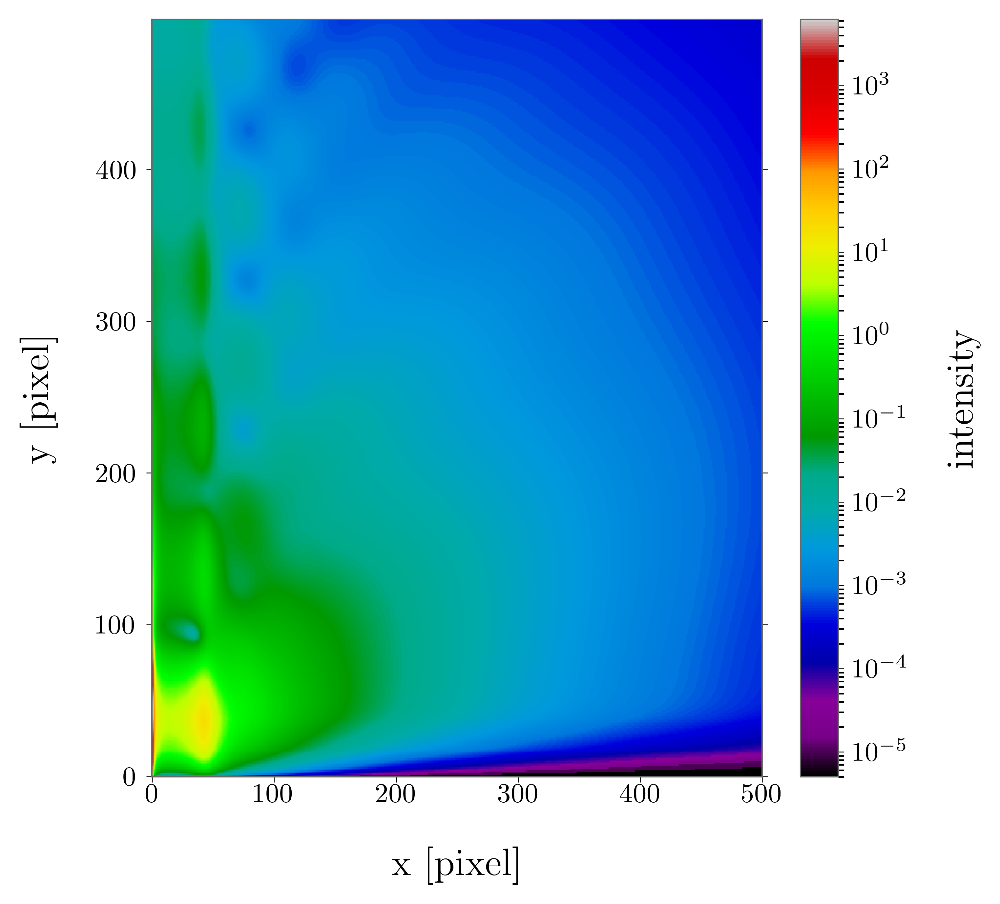

In [35]:
draw_plot(images[184].copy(),title= title, save=True, scale=True, z_limits=[images[184].min(), images[184].max()])

In [94]:
image_proc = []
image_0 = images[148].copy()
image_proc.append(image_0)
image_1 = crop_simulation(image=image_0.copy(), y=alpha_f_crop_index, x=two_theta_f_crop_index)
image_proc.append(image_1)
image_2 = bin_int(to_bin=image_1.copy(), bin_to_shape=shape_to_bin)
image_proc.append(image_2)
image_3 = crop_window(image=image_2.copy())
image_proc.append(image_3)
image_4 = normalize(image=image_3.copy())
image_proc.append(image_4)
image_5 = mask_image(image=image_4.copy(), mask=detector_mask)
image_proc.append(image_5)


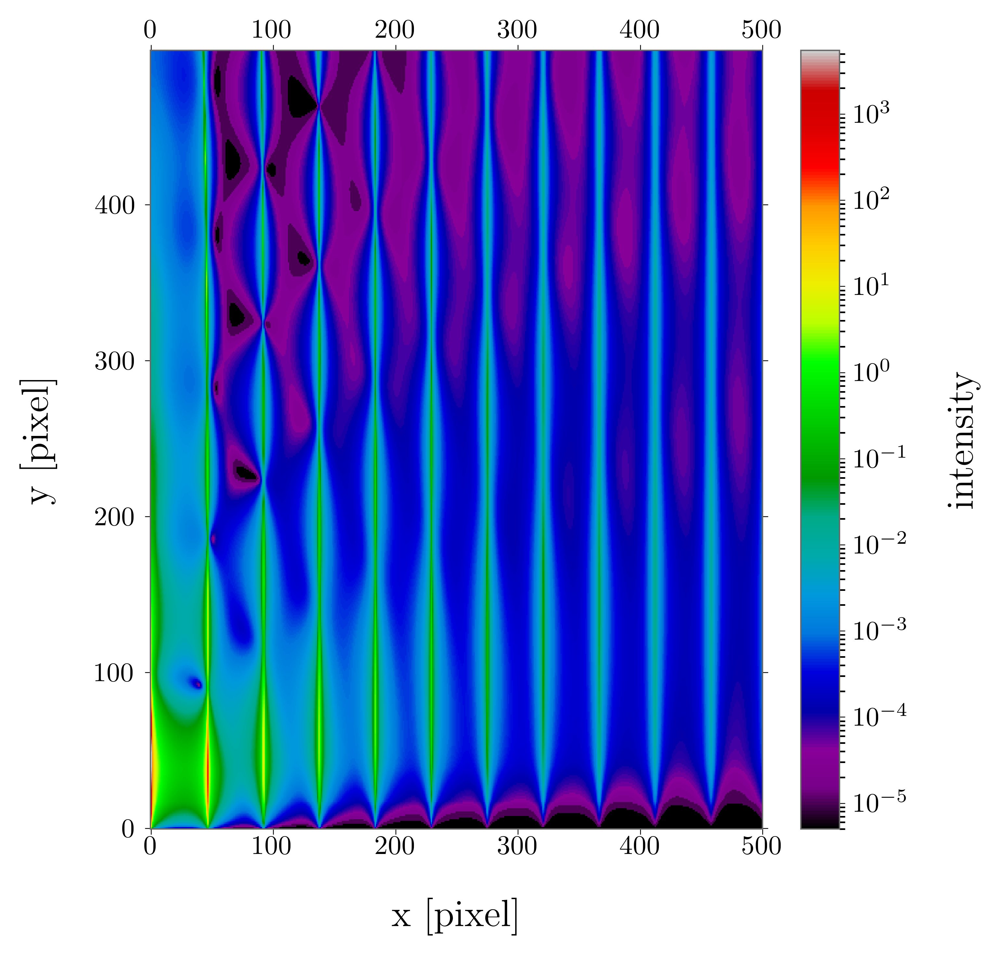

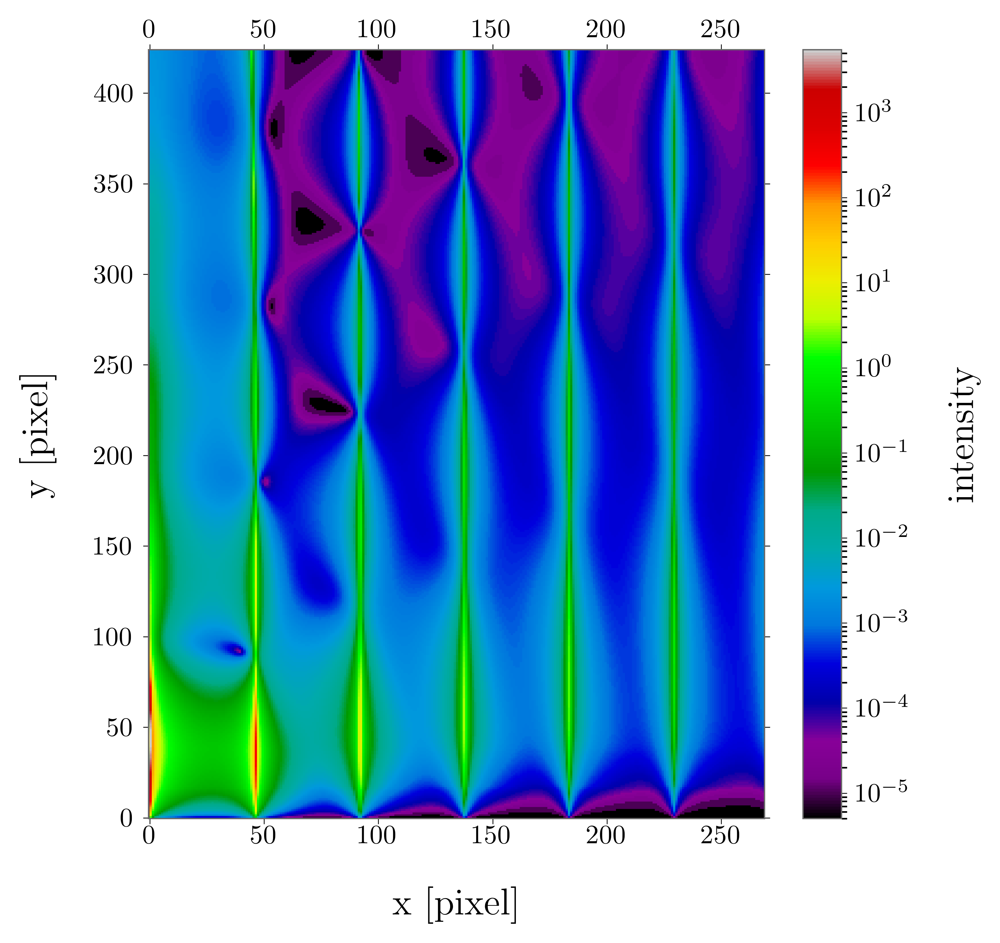

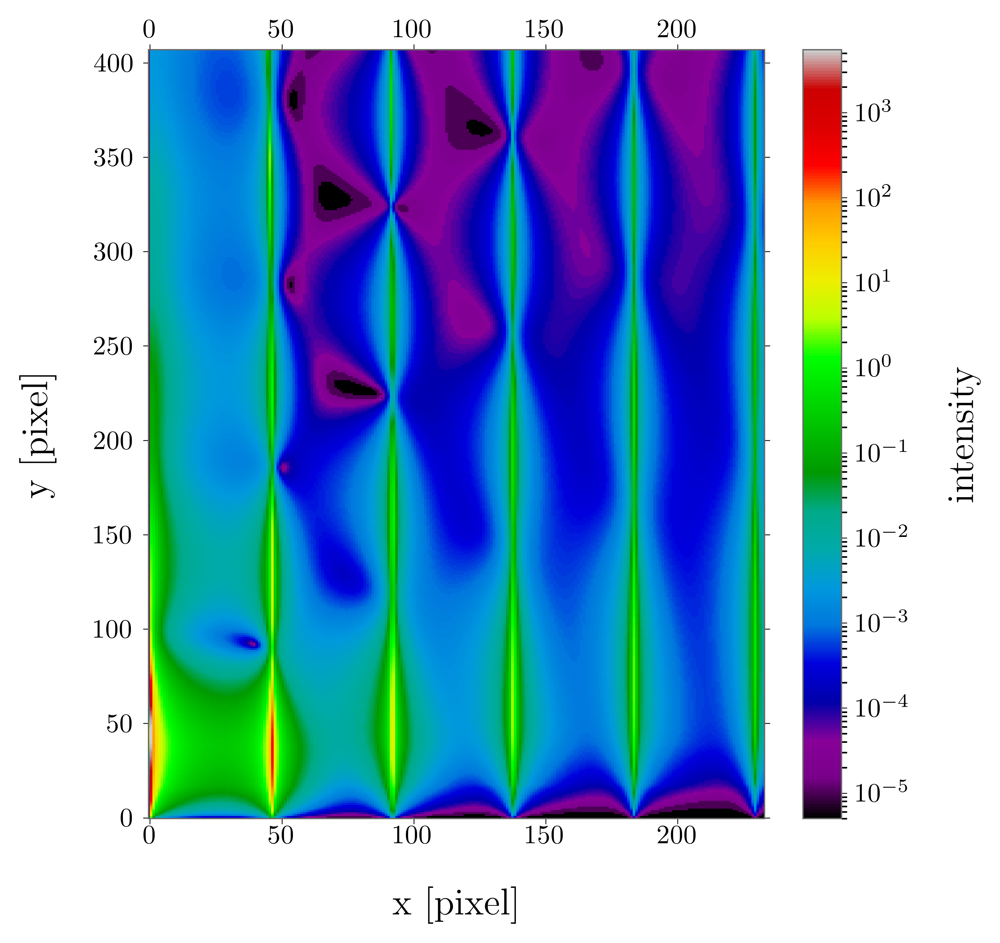

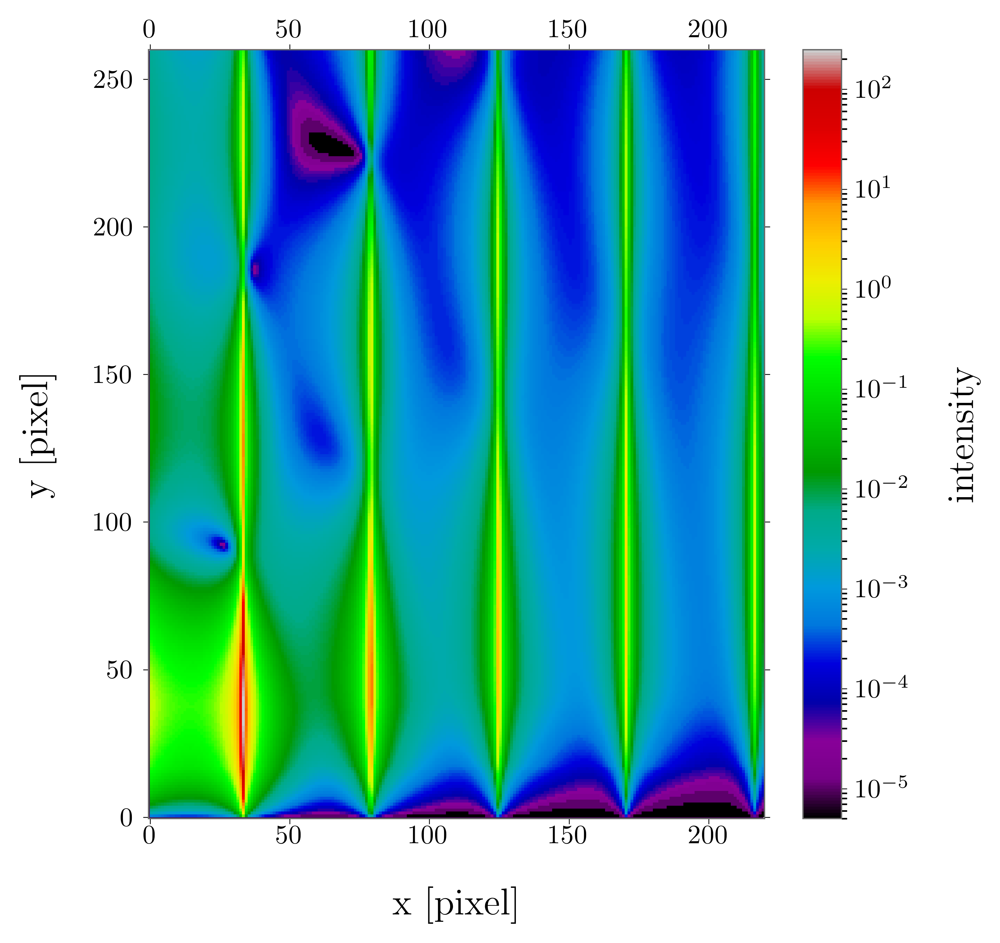

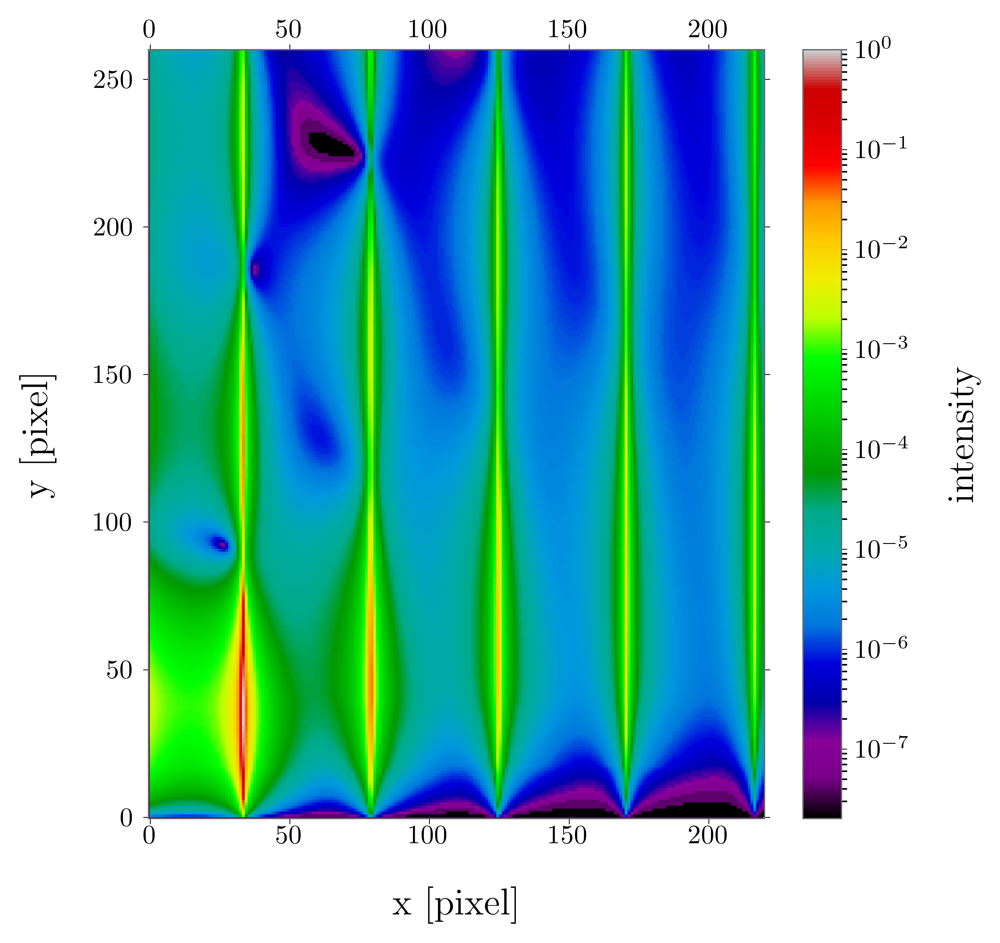

...

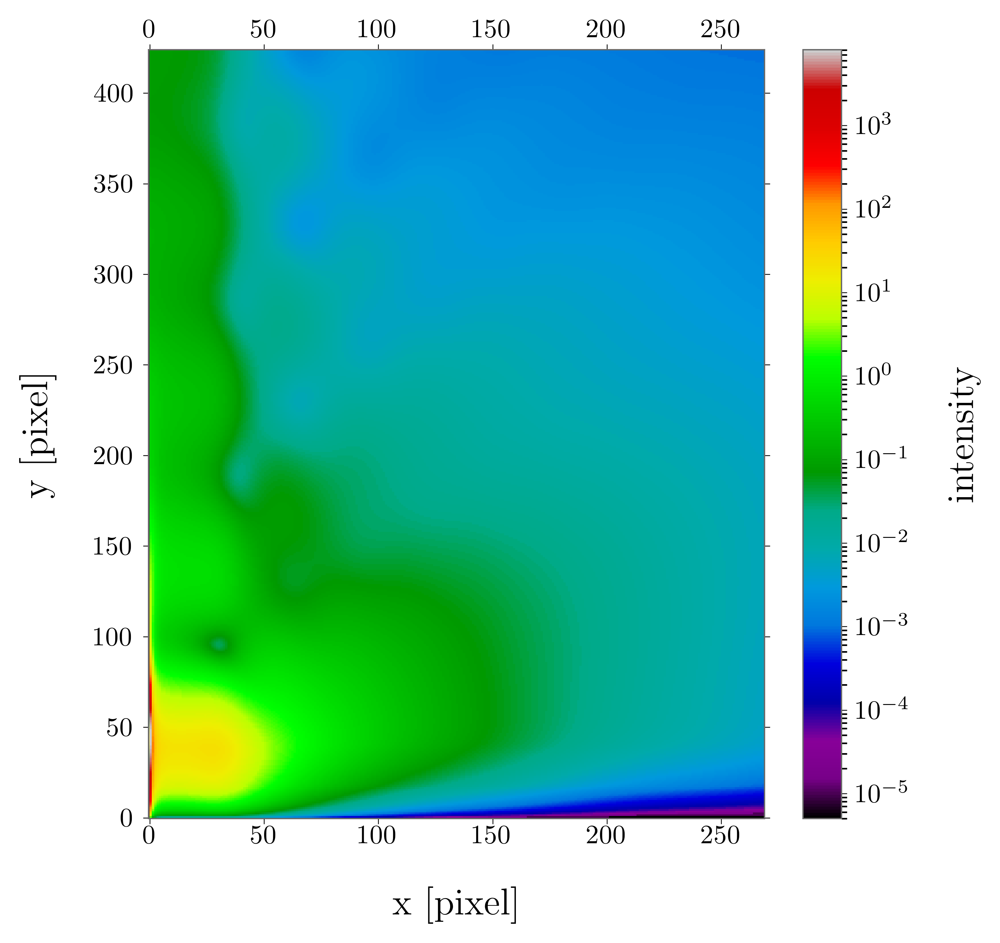

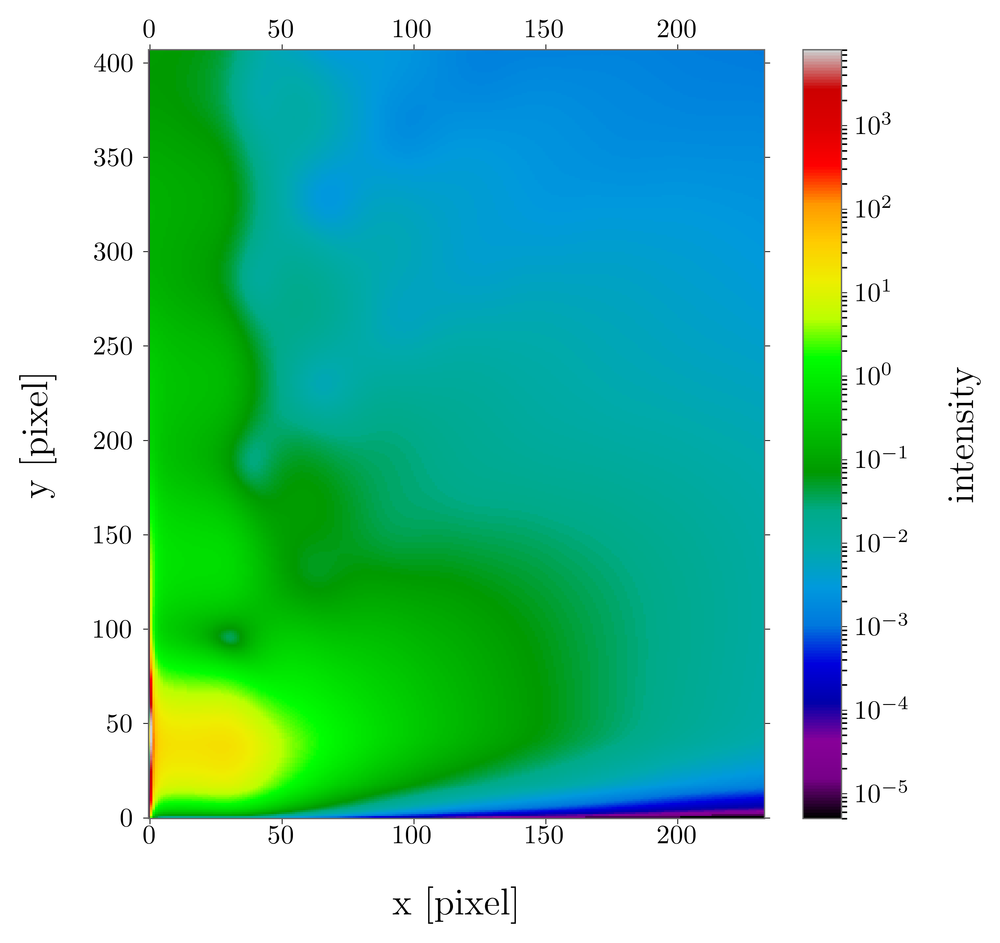

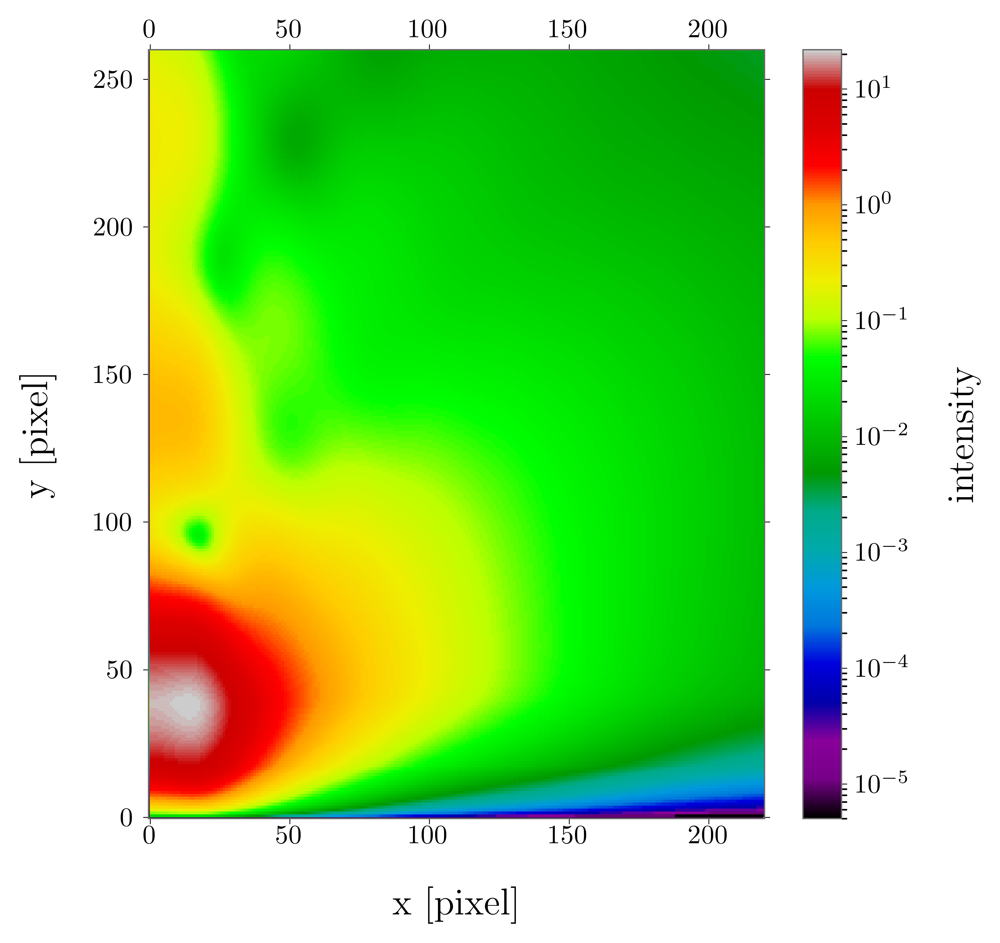

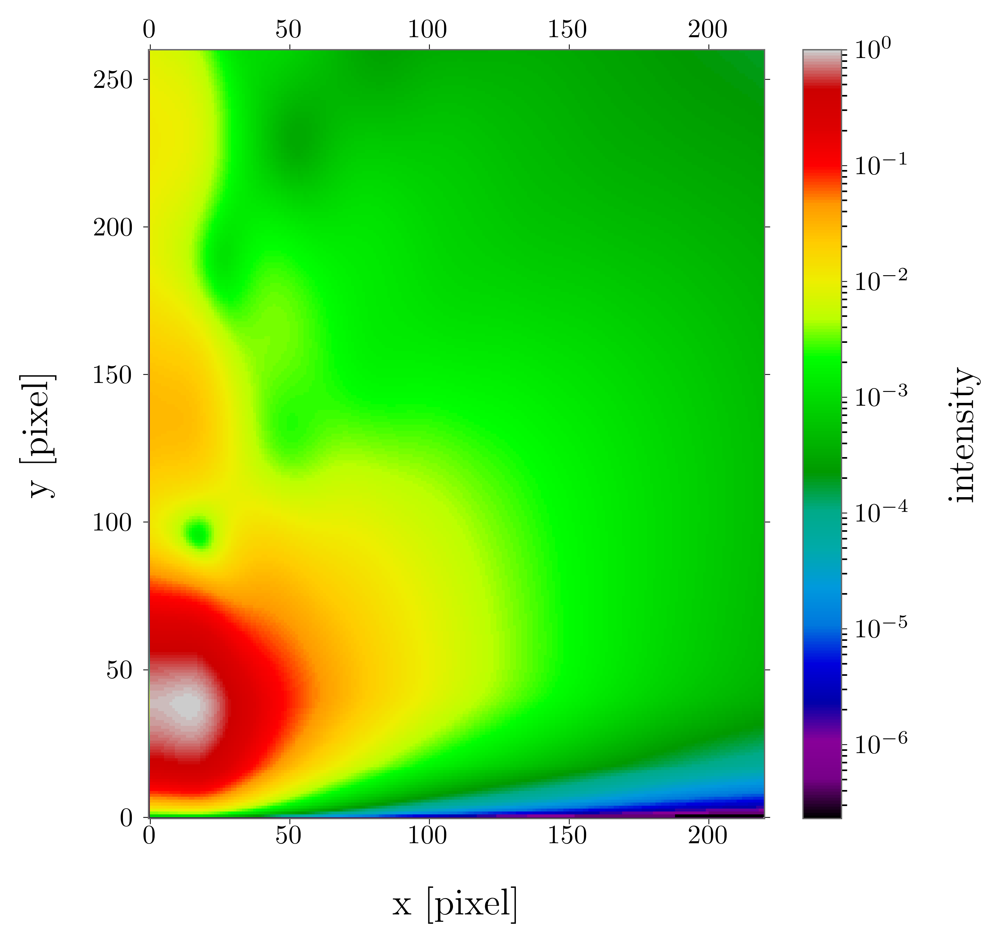

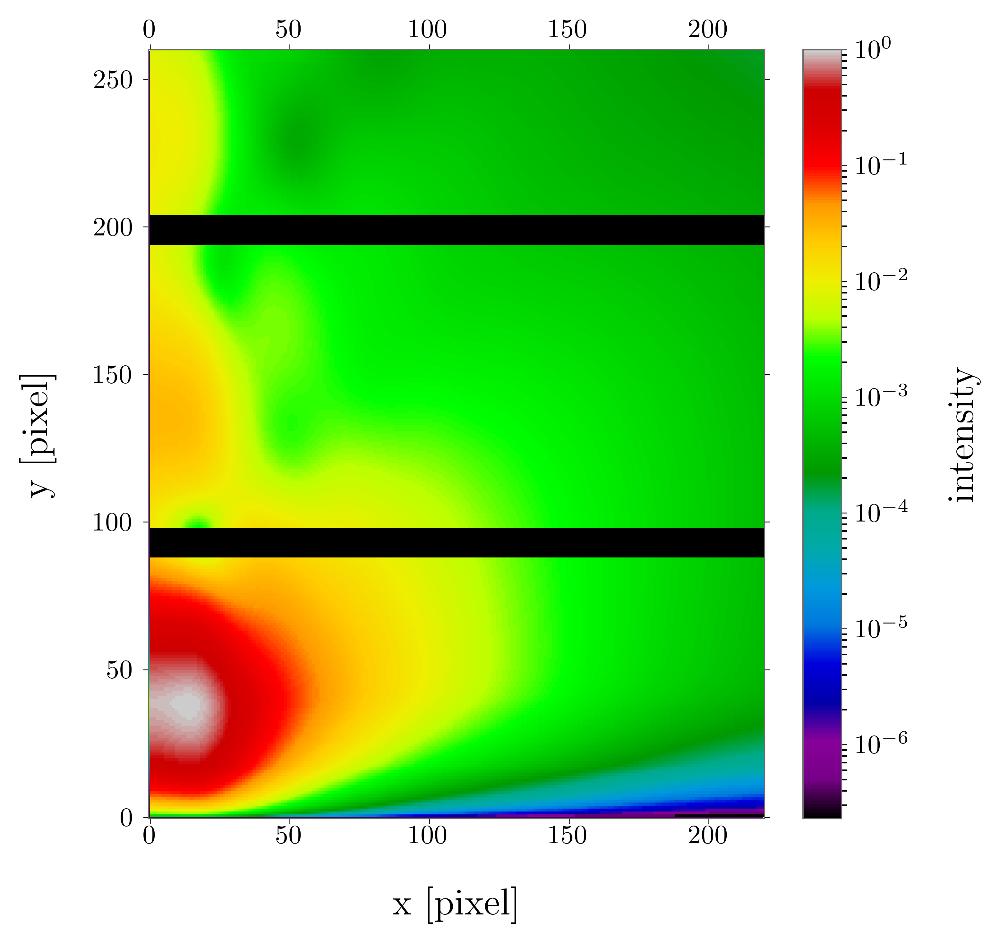

In [102]:
for i,img in enumerate(images[ids]):
    d = targets.loc[ids[i]][['distance','radius','omega_distance','sigma_radius']].to_dict()
    title = '_'.join(f"{k}-{v}" for k, v in d.items())
    image_proc = []
    image_0 = img.copy()
    image_proc.append(image_0)
    image_1 = crop_simulation(image=image_0.copy(), y=alpha_f_crop_index, x=two_theta_f_crop_index)
    image_proc.append(image_1)
    image_2 = bin_int(to_bin=image_1.copy(), bin_to_shape=shape_to_bin)
    image_proc.append(image_2)
    image_3 = crop_window(image=image_2.copy())
    image_proc.append(image_3)
    image_4 = normalize(image=image_3.copy())
    image_proc.append(image_4)
    image_5 = mask_image(image=image_4.copy(), mask=detector_mask)
    image_proc.append(image_5)

#image = find_image(images,targets)[0].copy()
    for i,image in enumerate(image_proc):
        draw_plot(image.copy(),title= str(i)+'_'+title, save=True, scale=True, z_limits=[image.min(), image.max()])